# EdgeYOLO-RS: A Next-Generation Lightweight YOLO Architecture for Robust Rotated Object Detection in DOTA v2.0 Remote Sensing Images

The objective of this project is to explore and extend the capabilities of the latest official YOLOv8 architecture for rotated object detection in remote sensing, and to develop an experimental enhanced version tentatively named YOLOv11-RS. While YOLOv8 provides a modular, high-speed, and highly accurate baseline, it lacks native support for rotated bounding boxes—a critical requirement for aerial datasets like DOTA v2.0. This project aims to bridge that gap by incorporating a rotation-aware detection head, improved multi-scale feature aggregation, and lightweight attention mechanisms to better handle small, densely packed, and orientation-varied targets. YOLOv11-RS will also experiment with architectural innovations such as hybrid dilated convolutions and a restructured neck design to expand receptive field and boost spatial awareness. The final goal is to compare and benchmark both YOLOv8 and YOLOv11-RS in terms of accuracy, speed, and edge device compatibility, thereby contributing a robust, scalable solution to the field of remote sensing object detection.

# Installing And Loading Required Modules

In [ ]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 124.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 76.8 MB/s eta 0:00:00


In [ ]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 82.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 111.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


# Mount Google Drive

In [ ]:
# Optionally if your data is there
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import random
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import os
import PIL
import shutil
from ultralytics import YOLO
from IPython.display import Image, display


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Running on: {device.upper()}")


Running on: CUDA


DOTA v2.0 dataset from Roboflow, using the YOLOv8-OBB (Oriented Bounding Box) format. This dataset contains aerial images with rotated object annotations, used for training object detection models on remote sensing tasks.

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="IW30vh6bVwF0UjmdKgzD")
project = rf.workspace("igor-na").project("dota-v2.0")
version = project.version(1)
dataset = version.download("yolov8-obb")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to DOTA-v2.0--1 in yolov8-obb:: 100%|██████████| 3656/3656 [00:07<00:00, 516.67it/s]


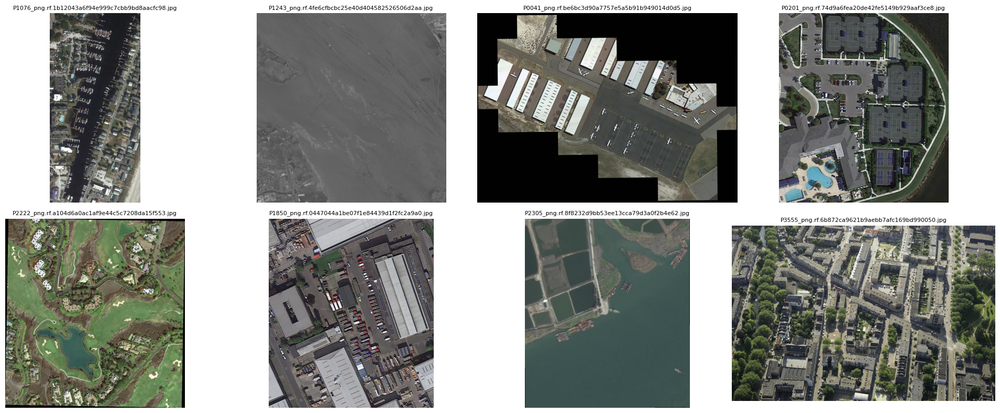

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

folder_type = "train"
image_dir = f"/content/DOTA-v2.0--1/{folder_type}/images"
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
num_images = 8
sample_files = random.sample(image_files, num_images)

plt.figure(figsize=(20, 8))  # wider for 8 images
for i, img_file in enumerate(sample_files):
    img_path = os.path.join(image_dir, img_file)
    image = Image.open(img_path)
    plt.subplot(2, 4, i+1)  # 2 rows, 4 columns
    plt.imshow(image)
    plt.title(img_file, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


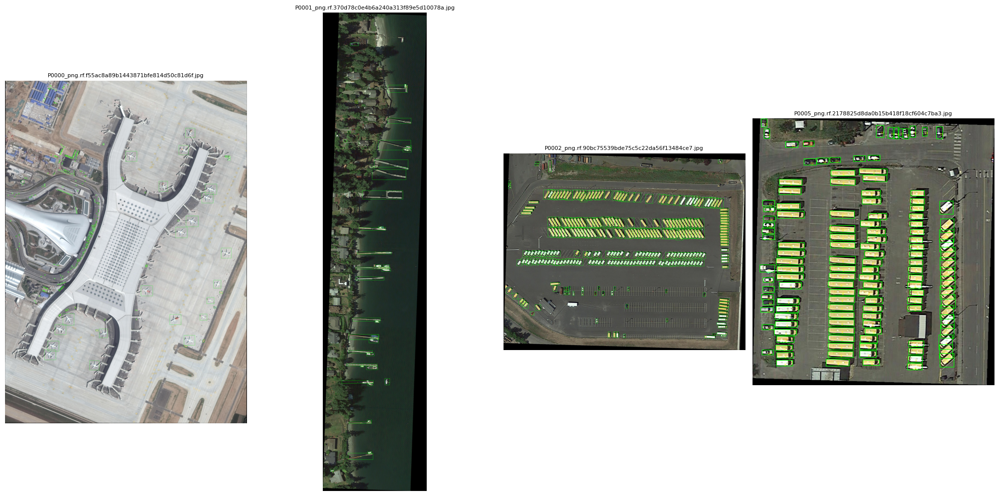

In [ ]:
folder_type = "train"
image_dir = f"/content/DOTA-v2.0--1/{folder_type}/images"
label_dir = f"/content/DOTA-v2.0--1/{folder_type}/labels"


image_files = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
num_images = 4
sample_files = image_files[:num_images]

# Display images with bounding boxes
plt.figure(figsize=(20, 10))

for i, img_file in enumerate(sample_files):
    img_path = os.path.join(image_dir, img_file)
    label_filename = os.path.splitext(img_file)[0] + ".txt"
    label_path = os.path.join(label_dir, label_filename)

    image = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(image)
    w, h = image.size  # image dimensions

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 9:
                    class_id = int(parts[0])
                    coords = list(map(float, parts[1:]))
                    # Convert normalized coords to absolute pixels
                    points = [
                        (coords[0] * w, coords[1] * h),
                        (coords[2] * w, coords[3] * h),
                        (coords[4] * w, coords[5] * h),
                        (coords[6] * w, coords[7] * h)
                    ]
                    draw.polygon(points, outline="lime", width=2)
                    # Draw class_id at center
                    cx = sum([x for x, _ in points]) / 4
                    cy = sum([y for _, y in points]) / 4
                    draw.text((cx, cy), str(class_id), fill="yellow")

    plt.subplot(1, 4, i+1)
    plt.imshow(image)
    plt.title(img_file, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os

base_path = "/content/DOTA-v2.0--1"
splits = ['train', 'valid', 'test']

for split in splits:
    image_dir = os.path.join(base_path, split, 'images')
    label_dir = os.path.join(base_path, split, 'labels')
    num_images = len([f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))])
    num_labels = len([f for f in os.listdir(label_dir) if f.endswith('.txt')])
    print(f"{split.upper()} - Images: {num_images}, Labels: {num_labels}")


TRAIN - Images: 1094, Labels: 1094
VALID - Images: 546, Labels: 546
TEST - Images: 182, Labels: 182


In [ ]:
from collections import Counter

def collect_class_counts(label_dir):
    class_counter = Counter()
    for label_file in os.listdir(label_dir):
        if label_file.endswith('.txt'):
            with open(os.path.join(label_dir, label_file)) as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 9:
                        class_id = int(parts[0])
                        class_counter[class_id] += 1
    return class_counter

train_label_dir = os.path.join(base_path, "train", "labels")
class_counts = collect_class_counts(train_label_dir)

print("\nClass Frequency in TRAIN:")
for class_id, count in class_counts.items():
    print(f"Class {class_id}: {count} instances")



Class Frequency in TRAIN:
Class 3: 1209 instances
Class 15: 3568 instances
Class 14: 215 instances
Class 0: 186 instances
Class 5: 247 instances
Class 11: 403 instances
Class 13: 88957 instances
Class 17: 1353 instances
Class 16: 1797 instances
Class 6: 4236 instances
Class 12: 25090 instances
Class 9: 15066 instances
Class 10: 3936 instances
Class 7: 198 instances
Class 2: 259 instances
Class 1: 298 instances
Class 4: 21 instances
Class 8: 5 instances


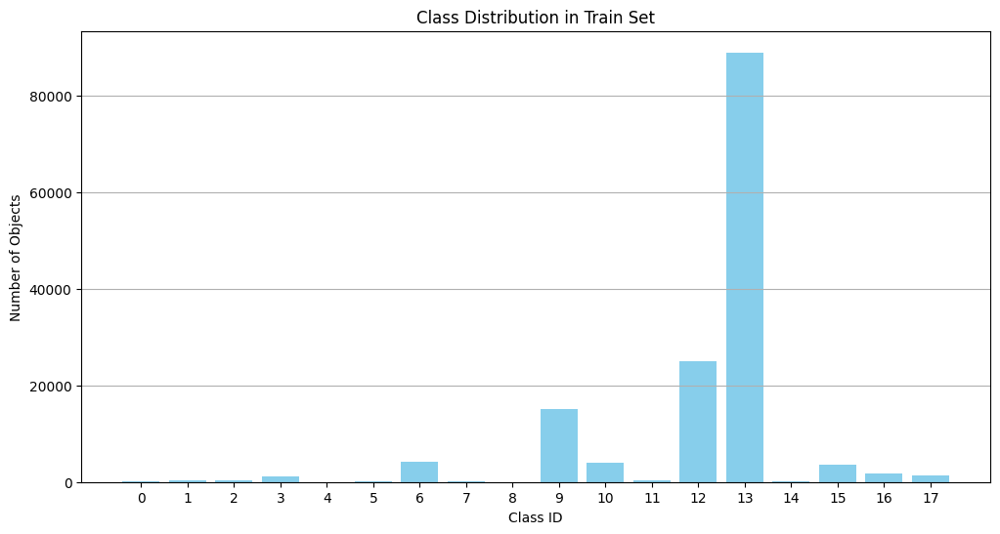

In [ ]:
import matplotlib.pyplot as plt

labels, values = zip(*sorted(class_counts.items()))
plt.figure(figsize=(12, 6))
plt.bar(labels, values, color='skyblue')
plt.xlabel("Class ID")
plt.ylabel("Number of Objects")
plt.title("Class Distribution in Train Set")
plt.xticks(labels)
plt.grid(axis='y')
plt.show()


# Data Preprocessing

Remove empty label files (no objects)

In [ ]:
def remove_empty_labels(label_dir):
    count = 0
    for file in os.listdir(label_dir):
        path = os.path.join(label_dir, file)
        if file.endswith('.txt') and os.path.getsize(path) == 0:
            os.remove(path)
            count += 1
    print(f"Removed {count} empty label files from {label_dir}")

for split in ['train', 'valid', 'test']:
    remove_empty_labels(f"/content/DOTA-v2.0--1/{split}/labels")


Removed 1 empty label files from /content/DOTA-v2.0--1/train/labels
Removed 0 empty label files from /content/DOTA-v2.0--1/valid/labels
Removed 0 empty label files from /content/DOTA-v2.0--1/test/labels


 Validate matching image-label pairs

In [ ]:
def validate_pairs(image_dir, label_dir):
    image_names = {os.path.splitext(f)[0] for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))}
    label_names = {os.path.splitext(f)[0] for f in os.listdir(label_dir) if f.endswith('.txt')}

    only_images = image_names - label_names
    only_labels = label_names - image_names

    print(f"Matched: {len(image_names & label_names)}")
    print(f"Images without labels: {len(only_images)}")
    print(f"Labels without images: {len(only_labels)}")

    return only_images, only_labels

for split in ['train', 'valid', 'test']:
    print(f"\nChecking {split.upper()}")
    image_dir = f"/content/DOTA-v2.0--1/{split}/images"
    label_dir = f"/content/DOTA-v2.0--1/{split}/labels"
    validate_pairs(image_dir, label_dir)



Checking TRAIN
Matched: 1093
Images without labels: 1
Labels without images: 0

Checking VALID
Matched: 546
Images without labels: 0
Labels without images: 0

Checking TEST
Matched: 182
Images without labels: 0
Labels without images: 0


# Resize All Images to a Fixed Size (e.g. 1024×1024)

In [ ]:
from PIL import Image
import os

def resize_images(image_dir, size=(1024, 1024)):
    count = 0
    for fname in os.listdir(image_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(image_dir, fname)
            img = Image.open(path).convert("RGB")
            img_resized = img.resize(size, Image.LANCZOS)
            img_resized.save(path)  # overwrite; or change path to save separately
            count += 1
    print(f"Resized {count} images in {image_dir} to {size[0]}×{size[1]}")

for split in ['train', 'valid', 'test']:
    resize_images(f"/content/DOTA-v2.0--1/{split}/images", size=(1024, 1024))


Resized 1094 images in /content/DOTA-v2.0--1/train/images to 1024×1024
Resized 546 images in /content/DOTA-v2.0--1/valid/images to 1024×1024
Resized 182 images in /content/DOTA-v2.0--1/test/images to 1024×1024


In [ ]:
from PIL import ImageEnhance

def enhance_images(image_dir):
    count = 0
    for fname in os.listdir(image_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(image_dir, fname)
            img = Image.open(path).convert("RGB")

            # Enhance sharpness and contrast slightly
            sharpness = ImageEnhance.Sharpness(img).enhance(1.5)
            contrast = ImageEnhance.Contrast(sharpness).enhance(1.2)

            contrast.save(path)  # or save to a new path
            count += 1
    print(f"Enhanced {count} images in {image_dir}")

for split in ['train', 'valid', 'test']:
    enhance_images(f"/content/DOTA-v2.0--1/{split}/images")


Enhanced 1094 images in /content/DOTA-v2.0--1/train/images
Enhanced 546 images in /content/DOTA-v2.0--1/valid/images
Enhanced 182 images in /content/DOTA-v2.0--1/test/images


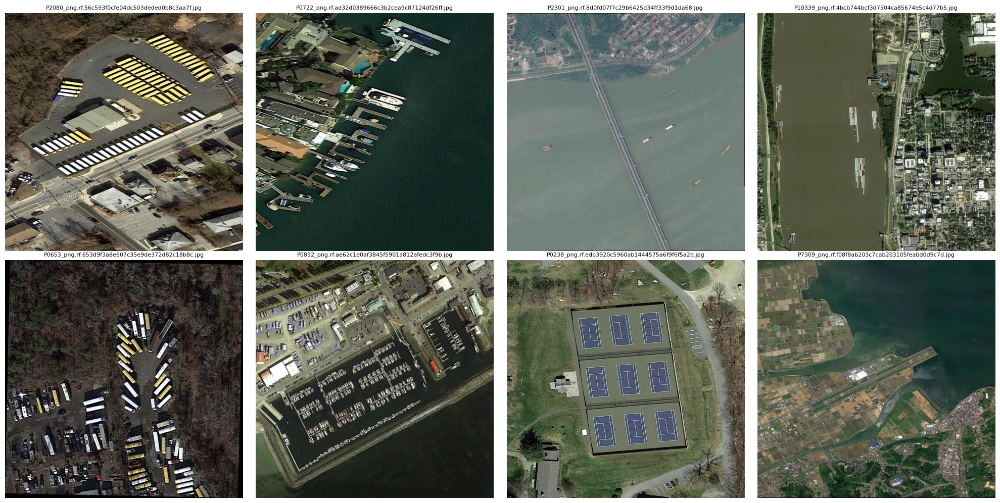

In [ ]:
folder_type = "train"
image_dir = f"/content/DOTA-v2.0--1/{folder_type}/images"

# Get image files
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
sample_files = random.sample(image_files, 8)

# Plot 8 images
plt.figure(figsize=(20, 10))
for i, img_file in enumerate(sample_files):
    img_path = os.path.join(image_dir, img_file)
    image = Image.open(img_path)

    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(img_file, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

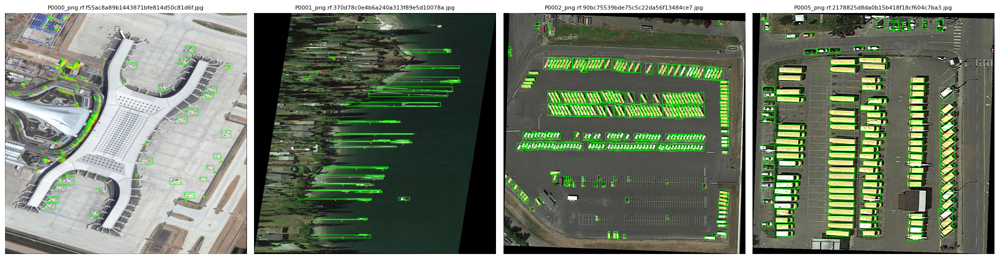

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

folder_type = "train"
image_dir = f"/content/DOTA-v2.0--1/{folder_type}/images"
label_dir = f"/content/DOTA-v2.0--1/{folder_type}/labels"

# Get sorted image files
image_files = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.png'))])
sample_files = image_files[:4]

plt.figure(figsize=(20, 10))

for i, img_file in enumerate(sample_files):
    img_path = os.path.join(image_dir, img_file)
    label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + ".txt")

    image = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(image)
    w, h = image.size

    # Draw bounding boxes
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 9:
                    class_id = int(parts[0])
                    coords = list(map(float, parts[1:]))
                    # Convert normalized coordinates to pixel positions
                    points = [
                        (coords[0]*w, coords[1]*h),
                        (coords[2]*w, coords[3]*h),
                        (coords[4]*w, coords[5]*h),
                        (coords[6]*w, coords[7]*h)
                    ]
                    draw.polygon(points, outline="lime", width=2)
                    cx = sum(x for x, _ in points) / 4
                    cy = sum(y for _, y in points) / 4
                    draw.text((cx, cy), str(class_id), fill="yellow")

    # Display
    plt.subplot(1, 4, i+1)
    plt.imshow(image)
    plt.title(img_file, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


# Model Traning

In [ ]:
!pip install -q ultralytics

In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n-obb.pt')

In [ ]:
model.train(
    data='/content/DOTA-v2.0--1/data.yaml',
    epochs=10,
    imgsz=1024,
    batch=2,   # was 8
    workers=1,
    device=0
)


Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/DOTA-v2.0--1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretr

train: Scanning /content/DOTA-v2.0--1/train/labels.cache... 1093 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1094/1094 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 41.5±14.5 MB/s, size: 205.2 KB)


val: Scanning /content/DOTA-v2.0--1/valid/labels.cache... 546 images, 0 backgrounds, 0 corrupt: 100%|██████████| 546/546 [00:00<?, ?it/s]


Plotting labels to runs/obb/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 63 weight(decay=0.0), 73 weight(decay=0.0005), 72 bias(decay=0.0)
Image sizes 1024 train, 1024 val
Using 1 dataloader workers
Logging results to runs/obb/train5
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       4.8G       1.96      4.686      2.353        169       1024: 100%|██████████| 547/547 [01:35<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:25<00:00, 10.52it/s]

                   all        546      87108      0.416      0.184      0.241      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      4.61G      1.703      2.973      1.989        820       1024: 100%|██████████| 547/547 [01:27<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:27<00:00,  9.86it/s]

                   all        546      87108      0.663      0.326      0.371      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.79G      1.609      2.385      1.909        159       1024: 100%|██████████| 547/547 [01:29<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:28<00:00,  9.59it/s]

                   all        546      87108      0.663      0.345      0.402      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.55G      1.559      2.228      1.869        171       1024: 100%|██████████| 547/547 [01:25<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:27<00:00, 10.00it/s]

                   all        546      87108      0.624      0.373      0.417      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.19G      1.501      2.119      1.854         76       1024: 100%|██████████| 547/547 [01:26<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:28<00:00,  9.53it/s]

                   all        546      87108      0.601      0.377      0.429        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.33G      1.496      1.963       1.79        229       1024: 100%|██████████| 547/547 [01:28<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:28<00:00,  9.73it/s]

                   all        546      87108      0.617      0.378       0.43      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       5.4G      1.475      1.861      1.825         73       1024: 100%|██████████| 547/547 [01:27<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:28<00:00,  9.50it/s]

                   all        546      87108      0.569      0.396       0.45      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       4.8G      1.456      1.856      1.799         81       1024: 100%|██████████| 547/547 [01:26<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:28<00:00,  9.69it/s]

                   all        546      87108       0.61      0.393      0.454      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.36G      1.426      1.745       1.83        478       1024: 100%|██████████| 547/547 [01:28<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:27<00:00,  9.83it/s]

                   all        546      87108       0.62      0.393      0.455      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.97G      1.403      1.742      1.824        582       1024: 100%|██████████| 547/547 [01:28<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:27<00:00, 10.04it/s]

                   all        546      87108      0.596      0.397      0.457      0.323



10 epochs completed in 0.325 hours.
Optimizer stripped from runs/obb/train5/weights/last.pt, 6.6MB
Optimizer stripped from runs/obb/train5/weights/best.pt, 6.6MB

Validating runs/obb/train5/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-obb summary (fused): 81 layers, 3,080,729 parameters, 0 gradients, 8.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 273/273 [00:24<00:00, 11.08it/s]


                   all        546      87108      0.596      0.396      0.457      0.323
               airport         81         81      0.434      0.464      0.399       0.16
      baseball-diamond         39         99      0.597      0.495      0.542      0.378
      basketball-court         43        189      0.746      0.436      0.515      0.377
                bridge         87        903      0.739      0.204      0.313      0.156
       container-crane          9        157          0          0          0          0
    ground-track-field         67        117      0.503       0.53      0.549      0.411
                harbor        134       1578      0.671      0.734      0.737      0.451
            helicopter          8        453          0          0          0          0
               helipad          1          3          0          0          0          0
         large-vehicle        181       7040      0.829      0.441       0.56      0.446
                 plan

ultralytics.utils.metrics.OBBMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x782f8892e910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    

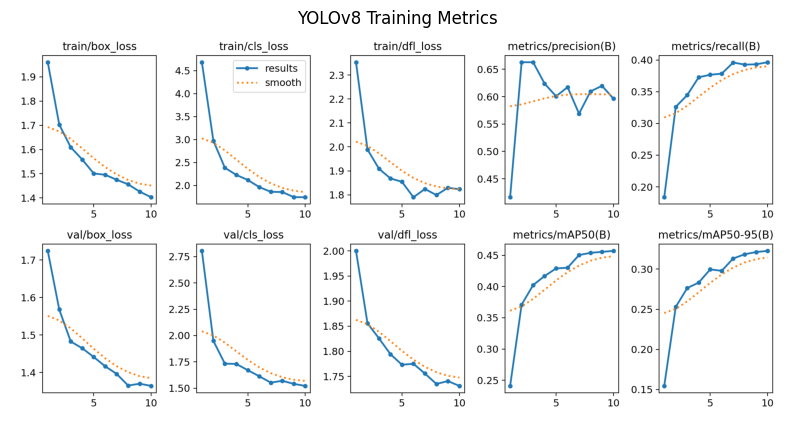

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Set your training results path
results_dir = '/content/runs/obb/train5'
results_file = os.path.join(results_dir, 'results.png')

# Display results.png (loss, mAP, precision, recall)
if os.path.exists(results_file):
    img = Image.open(results_file)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title("YOLOv8 Training Metrics")
    plt.show()
else:
    print("results.png not found — check training folder.")


# Load Trained model

In [ ]:
from ultralytics import YOLO
model = YOLO('/content/runs/obb/train5/weights/best.pt')



image 1/1 /content/DOTA-v2.0--1/test/images/P1049_png.rf.b6298fd081ca2fc54a7d77813f92b960.jpg: 1024x1024 None14.3ms
Speed: 5.3ms preprocess, 14.3ms inference, 2.9ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 /content/DOTA-v2.0--1/test/images/P1053_png.rf.83bb8ddcb32282f6a16c9bc1af76026a.jpg: 1024x1024 None14.3ms
Speed: 4.5ms preprocess, 14.3ms inference, 3.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 /content/DOTA-v2.0--1/test/images/P3668_png.rf.276f54e4d6c68fd100275da92ae51f49.jpg: 1024x1024 None14.3ms
Speed: 4.0ms preprocess, 14.3ms inference, 2.8ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 /content/DOTA-v2.0--1/test/images/P2769_png.rf.de51c927ac230345607dfd6849a162f4.jpg: 1024x1024 None14.3ms
Speed: 4.9ms preprocess, 14.3ms inference, 4.6ms postprocess per image at shape (1, 3, 1024, 1024)


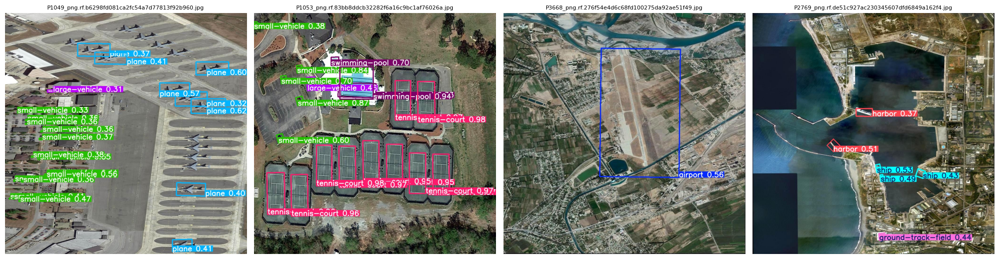

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Set path to test images
test_images_dir = '/content/DOTA-v2.0--1/test/images'
image_files = [f for f in os.listdir(test_images_dir) if f.endswith(('.jpg', '.png'))]

# Pick 4 random test images
sample_images = random.sample(image_files, 4)

plt.figure(figsize=(20, 10))

for i, img_name in enumerate(sample_images):
    img_path = os.path.join(test_images_dir, img_name)

    # Run inference
    results = model(img_path, conf=0.3)  # adjust conf threshold if needed

    # Save predicted image to view
    results[0].save(filename=f"predicted_{i}.jpg")

    # Display
    pred_img = Image.open(f"predicted_{i}.jpg")
    plt.subplot(1, 4, i+1)
    plt.imshow(pred_img)
    plt.title(img_name, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from google.colab import files
uploaded = files.upload()



In [ ]:
# Run prediction on video
results = model.predict(
    source='input.mp4',     # path to uploaded video
    save=True,              # save the video with predictions
    save_txt=False,
    conf=0.3,
    stream=False,
    imgsz=1024
)


In [ ]:
model = YOLO("yolo11n-obb.pt")  # load a pretrained model (recommended for training)

100%|██████████| 5.53M/5.53M [00:00<00:00, 87.6MB/s]


In [ ]:
# Train the model
results = model.train(data="/content/DOTA-v2.0--1/data.yaml", epochs=25, imgsz=640)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/DOTA-v2.0--1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretr

train: Scanning /content/DOTA-v2.0--1/train/labels.cache... 1093 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1094/1094 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1817.4±1083.0 MB/s, size: 205.2 KB)


val: Scanning /content/DOTA-v2.0--1/valid/labels.cache... 546 images, 0 backgrounds, 0 corrupt: 100%|██████████| 546/546 [00:00<?, ?it/s]


Plotting labels to runs/obb/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/obb/train6
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      8.58G       2.06       4.28      1.829        895        640: 100%|██████████| 69/69 [01:50<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.90it/s]

                   all        546      87108      0.194      0.161      0.179      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      8.25G      1.785      2.887      1.505        296        640: 100%|██████████| 69/69 [01:21<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.90it/s]


                   all        546      87108      0.687      0.186      0.273      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      12.1G      1.638      1.766      1.449        790        640: 100%|██████████| 69/69 [01:23<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:17<00:00,  1.95it/s]

                   all        546      87108      0.645      0.256      0.297      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      13.2G       1.54      1.419      1.447        502        640: 100%|██████████| 69/69 [01:20<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.88it/s]

                   all        546      87108      0.729       0.31      0.361      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      11.8G      1.486      1.271      1.442        925        640: 100%|██████████| 69/69 [01:21<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.87it/s]


                   all        546      87108      0.757      0.325      0.391      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      13.7G      1.446      1.197      1.432        502        640: 100%|██████████| 69/69 [01:19<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  80%|████████  | 28/35 [00:15<00:04,  1.62it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78311c42c5e0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78311

                   all        546      87108      0.697       0.33      0.401      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      11.5G      1.437      1.157       1.41        129        640: 100%|██████████| 69/69 [01:21<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.87it/s]

                   all        546      87108      0.681      0.346      0.409      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      6.19G      1.362      1.092      1.428       1368        640: 100%|██████████| 69/69 [01:21<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  71%|███████▏  | 25/35 [00:13<00:04,  2.35it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78311c42c5e0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  74%|███████▍  | 26/35 [00:13<00:04,  2.20it/s]^^^^^^^^^^^^^^^^^^^^^^^^^^^
Asser

                   all        546      87108      0.662      0.355       0.42      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      10.1G      1.403      1.105       1.42       1031        640: 100%|██████████| 69/69 [01:20<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.91it/s]


                   all        546      87108      0.666      0.355       0.42      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      10.5G      1.341      1.061      1.449        484        640: 100%|██████████| 69/69 [01:20<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:19<00:00,  1.79it/s]

                   all        546      87108      0.708      0.354      0.429      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      12.1G      1.334      1.046      1.401        815        640: 100%|██████████| 69/69 [01:18<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:19<00:00,  1.84it/s]

                   all        546      87108      0.671      0.369      0.432      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      7.53G      1.333      1.035      1.431        642        640: 100%|██████████| 69/69 [01:20<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:17<00:00,  1.98it/s]


                   all        546      87108      0.703      0.377      0.438      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      12.3G      1.282      0.979      1.413       1873        640: 100%|██████████| 69/69 [01:18<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:17<00:00,  2.00it/s]


                   all        546      87108      0.705      0.378      0.441      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      6.06G      1.312      1.006      1.433        299        640: 100%|██████████| 69/69 [01:18<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.86it/s]


                   all        546      87108      0.709      0.379      0.443      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      12.4G      1.299      1.005      1.404        749        640: 100%|██████████| 69/69 [01:20<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.93it/s]


                   all        546      87108      0.717      0.376      0.446      0.316
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      13.3G      1.199      0.946      1.414         67        640: 100%|██████████| 69/69 [01:21<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:17<00:00,  2.01it/s]


                   all        546      87108      0.645      0.382      0.447       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      7.47G      1.197     0.9275       1.41        206        640: 100%|██████████| 69/69 [00:41<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:16<00:00,  2.15it/s]


                   all        546      87108      0.718      0.382      0.444      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      14.1G      1.182     0.8979      1.391        493        640: 100%|██████████| 69/69 [00:43<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:18<00:00,  1.90it/s]


                   all        546      87108      0.707      0.382       0.45      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      9.33G      1.166     0.8905      1.403        262        640: 100%|██████████| 69/69 [00:40<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:16<00:00,  2.08it/s]


                   all        546      87108      0.724      0.382      0.452      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      12.8G      1.152     0.8756      1.388        350        640: 100%|██████████| 69/69 [00:42<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:16<00:00,  2.13it/s]


                   all        546      87108      0.715      0.383       0.45      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      11.2G      1.158     0.8789      1.401        839        640: 100%|██████████| 69/69 [00:41<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:17<00:00,  2.05it/s]

                   all        546      87108      0.708       0.39      0.458      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      11.6G      1.165     0.8701      1.372        803        640: 100%|██████████| 69/69 [00:43<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:17<00:00,  1.96it/s]


                   all        546      87108      0.722      0.387      0.458      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      11.4G       1.14     0.8522      1.376        128        640: 100%|██████████| 69/69 [00:42<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:16<00:00,  2.06it/s]


                   all        546      87108      0.711      0.391      0.458      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      11.1G      1.144     0.8569      1.382        219        640: 100%|██████████| 69/69 [00:42<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:16<00:00,  2.13it/s]


                   all        546      87108      0.705       0.39      0.457      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      11.1G      1.145     0.8656      1.382        640        640: 100%|██████████| 69/69 [00:42<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:19<00:00,  1.83it/s]

                   all        546      87108      0.685      0.399      0.459      0.335



25 epochs completed in 0.607 hours.
Optimizer stripped from runs/obb/train6/weights/last.pt, 5.7MB
Optimizer stripped from runs/obb/train6/weights/best.pt, 5.7MB

Validating runs/obb/train6/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-obb summary (fused): 109 layers, 2,657,233 parameters, 0 gradients, 6.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [00:54<00:00,  1.56s/it]


                   all        546      87108      0.684        0.4      0.459      0.335
               airport         81         81      0.752       0.84      0.825      0.526
      baseball-diamond         39         99      0.738      0.394      0.479      0.335
      basketball-court         43        189      0.874      0.492      0.585      0.469
                bridge         87        903      0.657      0.142        0.2     0.0929
       container-crane          9        157          0          0          0          0
    ground-track-field         67        117      0.571      0.436      0.488      0.391
                harbor        134       1578      0.765      0.771      0.794      0.508
            helicopter          8        453          1          0    0.00622    0.00497
               helipad          1          3          0          0          0          0
         large-vehicle        181       7040      0.801      0.446      0.565      0.459
                 plan

In [ ]:
from ultralytics import YOLO
model = YOLO('/content/runs/obb/train6/weights/best.pt')



image 1/1 /content/DOTA-v2.0--1/test/images/P2875_png.rf.e558c07f97bcc5a7b274cac9ea25e4df.jpg: 640x640 None41.8ms
Speed: 11.5ms preprocess, 41.8ms inference, 5.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/DOTA-v2.0--1/test/images/P10259_png.rf.08837d1cad13d9fe6042ce52eb45c319.jpg: 640x640 None28.4ms
Speed: 4.6ms preprocess, 28.4ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/DOTA-v2.0--1/test/images/P1892_png.rf.f571819b237dc54af9811f71c87f8086.jpg: 640x640 None22.0ms
Speed: 5.8ms preprocess, 22.0ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/DOTA-v2.0--1/test/images/P9895_png.rf.24f60eff145b8fe9d3334b2f7ddb60c1.jpg: 640x640 None28.8ms
Speed: 8.5ms preprocess, 28.8ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)


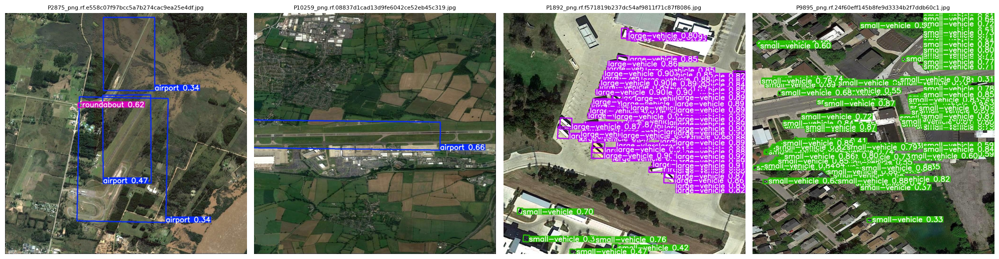

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Set path to test images
test_images_dir = '/content/DOTA-v2.0--1/test/images'
image_files = [f for f in os.listdir(test_images_dir) if f.endswith(('.jpg', '.png'))]

# Pick 4 random test images
sample_images = random.sample(image_files, 4)

plt.figure(figsize=(20, 10))

for i, img_name in enumerate(sample_images):
    img_path = os.path.join(test_images_dir, img_name)

    # Run inference
    results = model(img_path, conf=0.3)  # adjust conf threshold if needed

    # Save predicted image to view
    results[0].save(filename=f"predicted_{i}.jpg")

    # Display
    pred_img = Image.open(f"predicted_{i}.jpg")
    plt.subplot(1, 4, i+1)
    plt.imshow(pred_img)
    plt.title(img_name, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


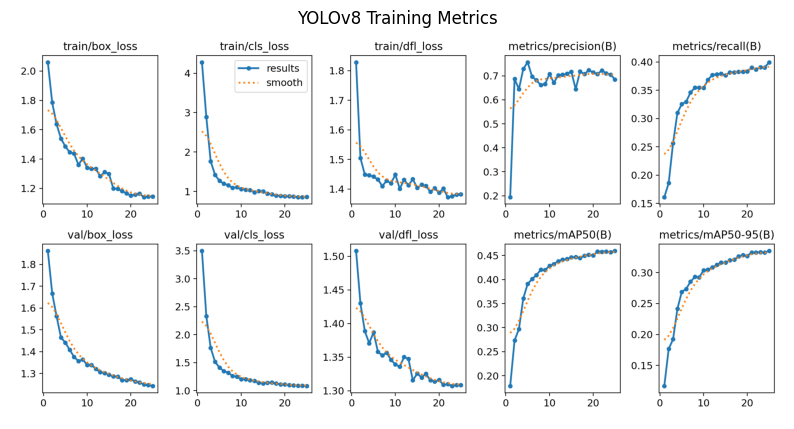

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Set your training results path
results_dir = '/content/runs/obb/train6'
results_file = os.path.join(results_dir, 'results.png')

# Display results.png (loss, mAP, precision, recall)
if os.path.exists(results_file):
    img = Image.open(results_file)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title("YOLOv8 Training Metrics")
    plt.show()
else:
    print("results.png not found — check training folder.")


In [ ]:
# Run prediction on video
results = model.predict(
    source='input.mp4',
    save=True,
    save_txt=False,
    conf=0.3,
    stream=False,
    imgsz=1024
)


In [ ]:
import os
import shutil
import random

original_base_path = "/content/DOTA-v2.0--1"
subset_base_path = "/content/DOTA-v2.0--subset"

subset_sizes = {
    'train': 200,
    'valid': 100,
    'test': 50
}

for split in ['train', 'valid', 'test']:
    image_dir = os.path.join(subset_base_path, split, 'images')
    label_dir = os.path.join(subset_base_path, split, 'labels')
    os.makedirs(image_dir, exist_ok=True)
    os.makedirs(label_dir, exist_ok=True)
    src_image_dir = os.path.join(original_base_path, split, 'images')
    src_label_dir = os.path.join(original_base_path, split, 'labels')
    image_files = [f for f in os.listdir(src_image_dir) if f.endswith(('.jpg', '.png'))]
    selected_files = random.sample(image_files, min(subset_sizes[split], len(image_files)))
    for img_file in selected_files:
        label_file = os.path.splitext(img_file)[0] + ".txt"

        shutil.copy(os.path.join(src_image_dir, img_file), os.path.join(image_dir, img_file))
        shutil.copy(os.path.join(src_label_dir, label_file), os.path.join(label_dir, label_file))

    print(f"{split.upper()} subset created with {len(selected_files)} samples.")


TRAIN subset created with 200 samples.
VALID subset created with 100 samples.
TEST subset created with 50 samples.


In [ ]:
model = YOLO("yolo11n-obb.pt")

100%|██████████| 5.53M/5.53M [00:00<00:00, 96.9MB/s]


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n-obb.pt")

results = model.train(
    data="/content/DOTA-v2.0--subset/data.yaml",
    epochs=25,
    imgsz=640,
    batch=8,
    lr0=0.05,
    patience=5,
)


Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/DOTA-v2.0--subset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, perspective=0.0, plots=True, pose=12.0, pr

train: Scanning /content/DOTA-v2.0--subset/train/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.2GB RAM): 100%|██████████| 200/200 [00:08<00:00, 22.39it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1156.3±709.5 MB/s, size: 1900.5 KB)


val: Scanning /content/DOTA-v2.0--subset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 100/100 [00:03<00:00, 25.12it/s]


Plotting labels to runs/obb/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000455, momentum=0.9) with parameter groups 63 weight(decay=0.0), 73 weight(decay=0.0005), 72 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/obb/train5
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      4.82G      2.156      4.404      1.902       1829        640: 100%|██████████| 25/25 [00:24<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.07it/s]

                   all        100      15168      0.112      0.123     0.0987     0.0517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      4.83G      2.055      3.985      1.754       1096        640: 100%|██████████| 25/25 [00:16<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.74it/s]

                   all        100      15168      0.458        0.1      0.169      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.85G      1.896       3.48      1.621        425        640: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.04it/s]

                   all        100      15168      0.642      0.117       0.19      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      4.87G      1.759      2.868       1.48       1051        640: 100%|██████████| 25/25 [00:15<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:04<00:00,  3.15it/s]

                   all        100      15168      0.479      0.151      0.183      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      6.73G      1.746      2.413      1.423       1055        640: 100%|██████████| 25/25 [00:14<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.43it/s]

                   all        100      15168      0.533       0.19      0.209       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      6.74G      1.702       2.28       1.37        780        640: 100%|██████████| 25/25 [00:15<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.61it/s]

                   all        100      15168      0.596      0.232      0.268      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      6.76G      1.604      1.932      1.374       1159        640: 100%|██████████| 25/25 [00:13<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.29it/s]

                   all        100      15168      0.688      0.233      0.299      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      8.88G      1.682      1.899      1.308       1012        640: 100%|██████████| 25/25 [00:14<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.51it/s]

                   all        100      15168      0.664       0.25      0.315      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      4.08G      1.506      1.748       1.34       1338        640: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:05<00:00,  2.57it/s]


                   all        100      15168      0.635       0.29      0.333      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      4.08G      1.537      1.581      1.313       1195        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  4.08it/s]

                   all        100      15168      0.702      0.302      0.336      0.217


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.97G      1.403      1.614       1.36        692        640: 100%|██████████| 25/25 [00:10<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.17it/s]

                   all        100      15168      0.637      0.312      0.342      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      5.97G      1.415      1.597      1.378        108        640: 100%|██████████| 25/25 [00:08<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.77it/s]

                   all        100      15168      0.706      0.296      0.354      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      5.97G      1.429      1.555      1.347        671        640: 100%|██████████| 25/25 [00:06<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.87it/s]


                   all        100      15168      0.742      0.293      0.368      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.87G      1.373      1.461      1.345       1499        640: 100%|██████████| 25/25 [00:07<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.43it/s]

                   all        100      15168      0.739      0.313       0.38      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      6.06G      1.384       1.62      1.339        919        640: 100%|██████████| 25/25 [00:08<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.90it/s]

                   all        100      15168      0.707      0.336      0.388      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      6.06G      1.384      1.473      1.318        659        640: 100%|██████████| 25/25 [00:08<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.98it/s]

                   all        100      15168      0.684       0.34      0.377      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      6.06G      1.402      1.388      1.301        529        640: 100%|██████████| 25/25 [00:08<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:03<00:00,  3.64it/s]

                   all        100      15168      0.692      0.341      0.384       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      8.16G      1.381      1.495      1.305        665        640: 100%|██████████| 25/25 [00:06<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.35it/s]


                   all        100      15168      0.707       0.34      0.385      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         6G      1.349      1.412      1.313       1666        640: 100%|██████████| 25/25 [00:07<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.39it/s]

                   all        100      15168      0.698      0.337      0.384      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      8.08G      1.375      1.458      1.317        816        640: 100%|██████████| 25/25 [00:08<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  5.38it/s]

                   all        100      15168      0.657      0.333      0.383      0.255



20 epochs completed in 0.091 hours.
Optimizer stripped from runs/obb/train5/weights/last.pt, 6.4MB
Optimizer stripped from runs/obb/train5/weights/best.pt, 6.4MB

Validating runs/obb/train5/weights/best.pt...
Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-obb summary (fused): 81 layers, 3,080,729 parameters, 0 gradients, 8.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/13 [00:00<?, ?it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 1/13 [00:00<00:02,  4.82it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 2/13 [00:02<00:15,  1.38s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 3/13 [00:03<00:11,  1.15s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 4/13 [00:04<00:10,  1.13s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 5/13 [00:05<00:09,  1.16s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 6/13 [00:06<00:07,  1.06s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 7/13 [00:08<00:07,  1.27s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 8/13 [00:09<00:06,  1.33s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 9/13 [00:10<00:05,  1.33s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 10/13 [00:11<00:03,  1.19s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 11/13 [00:12<00:01,  1.06it/s]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 12/13 [00:13<00:01,  1.01s/it]

WARNING ⚠️ Model does not support 'augment=True', reverting to single-scale prediction.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:13<00:00,  1.05s/it]


                   all        100      15168      0.696      0.337      0.384      0.255
               airport         13         13      0.534      0.615      0.704      0.368
      baseball-diamond          7         27      0.923       0.63      0.714      0.516
      basketball-court          7         49      0.585      0.388      0.444      0.332
                bridge         19        162          0          0          0          0
       container-crane          2         29          1          0          0          0
    ground-track-field         13         26      0.728      0.231       0.28      0.205
                harbor         28        274       0.67      0.657      0.681       0.42
            helicopter          3        255          1          0          0          0
         large-vehicle         29        960      0.512       0.36      0.389      0.263
                 plane         11        667      0.625      0.625      0.675      0.421
            roundabou

Columns in your CSV:
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']
Found Precision column: metrics/precision(B)
Found Accuracy (Recall) column: metrics/recall(B)


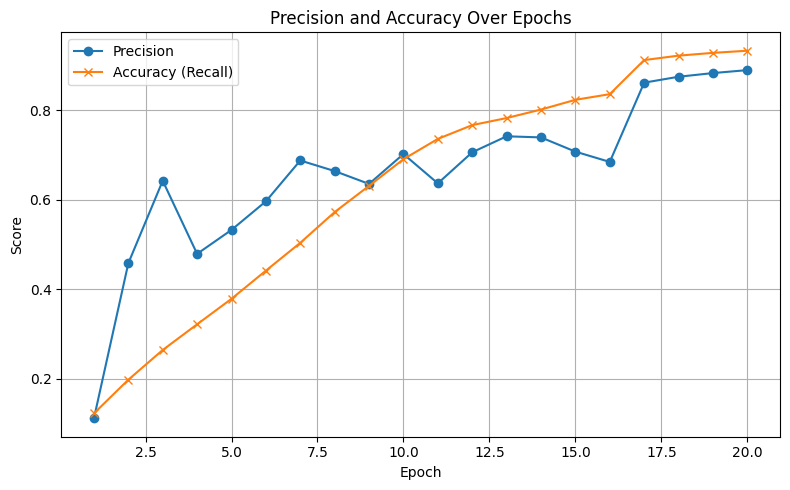


Final Precision: 0.8893
Final Accuracy (Recall): 0.9326


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load CSV
csv_path = "/content/runs/obb/train5/results.csv"
df = pd.read_csv(csv_path)

print("Columns in your CSV:")
print(df.columns.tolist())

df.columns = df.columns.str.strip()

for col in df.columns:
    if "precision" in col.lower():
        print("Found Precision column:", col)
    if "recall" in col.lower():
        print("Found Accuracy (Recall) column:", col)

precision_col = [col for col in df.columns if "precision" in col.lower()][0]
recall_col = [col for col in df.columns if "recall" in col.lower()][0]

plt.figure(figsize=(8, 5))
plt.plot(df['epoch'], df[precision_col], label='Precision', marker='o')
plt.plot(df['epoch'], df[recall_col], label='Accuracy (Recall)', marker='x')
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Precision and Accuracy Over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
print(f"\nFinal Precision: {df[precision_col].iloc[-1]:.4f}")
print(f"Final Accuracy (Recall): {df[recall_col].iloc[-1]:.4f}")
